In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/proj/all-data_cleaned.zip

In [ ]:
!rm __MACOSX/*/*/._.DS_Store

## Imports

In [ ]:
import random
from torchvision.transforms import functional as F
from collections import defaultdict, deque
import pickle
import torch.distributed as dist
import errno
import datetime
import pycocotools._mask as _mask
import json
import tempfile
import torch._six
import pycocotools.mask as mask_util
from collections import defaultdict
import copy
import torch.utils.data
from pycocotools import mask as coco_mask
from pycocotools.coco import COCO
import math
import sys
import time
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torchvision.transforms as transforms
import os
import numpy as np
import torch
from PIL import Image
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

## Transforms

In [ ]:

def _flip_coco_person_keypoints(kps, width):
    flip_inds = [0, 2, 1, 4, 3, 6, 5, 8, 7, 10, 9, 12, 11, 14, 13, 16, 15]
    flipped_data = kps[:, flip_inds]
    flipped_data[..., 0] = width - flipped_data[..., 0]
    # Maintain COCO convention that if visibility == 0, then x, y = 0
    inds = flipped_data[..., 2] == 0
    flipped_data[inds] = 0
    return flipped_data


class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, target):
        for t in self.transforms:
            image, target = t(image, target)
        return image, target


class RandomHorizontalFlip(object):
    def __init__(self, prob):
        self.prob = prob

    def __call__(self, image, target):
        if random.random() < self.prob:
            height, width = image.shape[-2:]
            image = image.flip(-1)
            bbox = target["boxes"]
            bbox[:, [0, 2]] = width - bbox[:, [2, 0]]
            target["boxes"] = bbox
            if "masks" in target:
                target["masks"] = target["masks"].flip(-1)
            if "keypoints" in target:
                keypoints = target["keypoints"]
                keypoints = _flip_coco_person_keypoints(keypoints, width)
                target["keypoints"] = keypoints
        return image, target


class ToTensor(object):
    def __call__(self, image, target):
        image = F.to_tensor(image)
        return image, target


## Utils

In [ ]:

class SmoothedValue(object):
    """Track a series of values and provide access to smoothed values over a
    window or the global series average.
    """

    def __init__(self, window_size=20, fmt=None):
        if fmt is None:
            fmt = "{median:.4f} ({global_avg:.4f})"
        self.deque = deque(maxlen=window_size)
        self.total = 0.0
        self.count = 0
        self.fmt = fmt

    def update(self, value, n=1):
        self.deque.append(value)
        self.count += n
        self.total += value * n

    def synchronize_between_processes(self):
        """
        Warning: does not synchronize the deque!
        """
        if not is_dist_avail_and_initialized():
            return
        t = torch.tensor([self.count, self.total], dtype=torch.float64, device='cuda')
        dist.barrier()
        dist.all_reduce(t)
        t = t.tolist()
        self.count = int(t[0])
        self.total = t[1]

    @property
    def median(self):
        d = torch.tensor(list(self.deque))
        return d.median().item()

    @property
    def avg(self):
        d = torch.tensor(list(self.deque), dtype=torch.float32)
        return d.mean().item()

    @property
    def global_avg(self):
        return self.total / self.count

    @property
    def max(self):
        return max(self.deque)

    @property
    def value(self):
        return self.deque[-1]

    def __str__(self):
        return self.fmt.format(
            median=self.median,
            avg=self.avg,
            global_avg=self.global_avg,
            max=self.max,
            value=self.value)


def all_gather(data):
    """
    Run all_gather on arbitrary picklable data (not necessarily tensors)
    Args:
        data: any picklable object
    Returns:
        list[data]: list of data gathered from each rank
    """
    world_size = get_world_size()
    if world_size == 1:
        return [data]

    # serialized to a Tensor
    buffer = pickle.dumps(data)
    storage = torch.ByteStorage.from_buffer(buffer)
    tensor = torch.ByteTensor(storage).to("cuda")

    # obtain Tensor size of each rank
    local_size = torch.tensor([tensor.numel()], device="cuda")
    size_list = [torch.tensor([0], device="cuda") for _ in range(world_size)]
    dist.all_gather(size_list, local_size)
    size_list = [int(size.item()) for size in size_list]
    max_size = max(size_list)

    # receiving Tensor from all ranks
    # we pad the tensor because torch all_gather does not support
    # gathering tensors of different shapes
    tensor_list = []
    for _ in size_list:
        tensor_list.append(torch.empty((max_size,), dtype=torch.uint8, device="cuda"))
    if local_size != max_size:
        padding = torch.empty(size=(max_size - local_size,), dtype=torch.uint8, device="cuda")
        tensor = torch.cat((tensor, padding), dim=0)
    dist.all_gather(tensor_list, tensor)

    data_list = []
    for size, tensor in zip(size_list, tensor_list):
        buffer = tensor.cpu().numpy().tobytes()[:size]
        data_list.append(pickle.loads(buffer))

    return data_list


def reduce_dict(input_dict, average=True):
    """
    Args:
        input_dict (dict): all the values will be reduced
        average (bool): whether to do average or sum
    Reduce the values in the dictionary from all processes so that all processes
    have the averaged results. Returns a dict with the same fields as
    input_dict, after reduction.
    """
    world_size = get_world_size()
    if world_size < 2:
        return input_dict
    with torch.no_grad():
        names = []
        values = []
        # sort the keys so that they are consistent across processes
        for k in sorted(input_dict.keys()):
            names.append(k)
            values.append(input_dict[k])
        values = torch.stack(values, dim=0)
        dist.all_reduce(values)
        if average:
            values /= world_size
        reduced_dict = {k: v for k, v in zip(names, values)}
    return reduced_dict


class MetricLogger(object):
    def __init__(self, delimiter="\t"):
        self.meters = defaultdict(SmoothedValue)
        self.delimiter = delimiter

    def update(self, **kwargs):
        for k, v in kwargs.items():
            if isinstance(v, torch.Tensor):
                v = v.item()
            assert isinstance(v, (float, int))
            self.meters[k].update(v)

    def __getattr__(self, attr):
        if attr in self.meters:
            return self.meters[attr]
        if attr in self.__dict__:
            return self.__dict__[attr]
        raise AttributeError("'{}' object has no attribute '{}'".format(
            type(self).__name__, attr))

    def __str__(self):
        loss_str = []
        for name, meter in self.meters.items():
            loss_str.append(
                "{}: {}".format(name, str(meter))
            )
        return self.delimiter.join(loss_str)

    def synchronize_between_processes(self):
        for meter in self.meters.values():
            meter.synchronize_between_processes()

    def add_meter(self, name, meter):
        self.meters[name] = meter

    def log_every(self, iterable, print_freq, header=None):
        i = 0
        if not header:
            header = ''
        start_time = time.time()
        end = time.time()
        iter_time = SmoothedValue(fmt='{avg:.4f}')
        data_time = SmoothedValue(fmt='{avg:.4f}')
        space_fmt = ':' + str(len(str(len(iterable)))) + 'd'
        if torch.cuda.is_available():
            log_msg = self.delimiter.join([
                header,
                '[{0' + space_fmt + '}/{1}]',
                'eta: {eta}',
                '{meters}',
                'time: {time}',
                'data: {data}',
                'max mem: {memory:.0f}'
            ])
        else:
            log_msg = self.delimiter.join([
                header,
                '[{0' + space_fmt + '}/{1}]',
                'eta: {eta}',
                '{meters}',
                'time: {time}',
                'data: {data}'
            ])
        MB = 1024.0 * 1024.0
        for obj in iterable:
            data_time.update(time.time() - end)
            yield obj
            iter_time.update(time.time() - end)
            if i % print_freq == 0 or i == len(iterable) - 1:
                eta_seconds = iter_time.global_avg * (len(iterable) - i)
                eta_string = str(datetime.timedelta(seconds=int(eta_seconds)))
                if torch.cuda.is_available():
                    print(log_msg.format(
                        i, len(iterable), eta=eta_string,
                        meters=str(self),
                        time=str(iter_time), data=str(data_time),
                        memory=torch.cuda.max_memory_allocated() / MB))
                else:
                    print(log_msg.format(
                        i, len(iterable), eta=eta_string,
                        meters=str(self),
                        time=str(iter_time), data=str(data_time)))
            i += 1
            end = time.time()
        total_time = time.time() - start_time
        total_time_str = str(datetime.timedelta(seconds=int(total_time)))
        print('{} Total time: {} ({:.4f} s / it)'.format(
            header, total_time_str, total_time / len(iterable)))


def collate_fn(batch):
    return tuple(zip(*batch))


def warmup_lr_scheduler(optimizer, warmup_iters, warmup_factor):

    def f(x):
        if x >= warmup_iters:
            return 1
        alpha = float(x) / warmup_iters
        return warmup_factor * (1 - alpha) + alpha

    return torch.optim.lr_scheduler.LambdaLR(optimizer, f)


def mkdir(path):
    try:
        os.makedirs(path)
    except OSError as e:
        if e.errno != errno.EEXIST:
            raise


def setup_for_distributed(is_master):
    """
    This function disables printing when not in master process
    """
    import builtins as __builtin__
    builtin_print = __builtin__.print

    def print(*args, **kwargs):
        force = kwargs.pop('force', False)
        if is_master or force:
            builtin_print(*args, **kwargs)

    __builtin__.print = print


def is_dist_avail_and_initialized():
    if not dist.is_available():
        return False
    if not dist.is_initialized():
        return False
    return True


def get_world_size():
    if not is_dist_avail_and_initialized():
        return 1
    return dist.get_world_size()


def get_rank():
    if not is_dist_avail_and_initialized():
        return 0
    return dist.get_rank()


def is_main_process():
    return get_rank() == 0


def save_on_master(*args, **kwargs):
    if is_main_process():
        torch.save(*args, **kwargs)


def init_distributed_mode(args):
    if 'RANK' in os.environ and 'WORLD_SIZE' in os.environ:
        args.rank = int(os.environ["RANK"])
        args.world_size = int(os.environ['WORLD_SIZE'])
        args.gpu = int(os.environ['LOCAL_RANK'])
    elif 'SLURM_PROCID' in os.environ:
        args.rank = int(os.environ['SLURM_PROCID'])
        args.gpu = args.rank % torch.cuda.device_count()
    else:
        print('Not using distributed mode')
        args.distributed = False
        return

    args.distributed = True

    torch.cuda.set_device(args.gpu)
    args.dist_backend = 'nccl'
    print('| distributed init (rank {}): {}'.format(
        args.rank, args.dist_url), flush=True)
    torch.distributed.init_process_group(backend=args.dist_backend, init_method=args.dist_url,
                                         world_size=args.world_size, rank=args.rank)
    torch.distributed.barrier()
    setup_for_distributed(args.rank == 0)

## Coco Eval helper

In [ ]:

iou         = _mask.iou
merge       = _mask.merge
frPyObjects = _mask.frPyObjects

def encode(bimask):
    if len(bimask.shape) == 3:
        return _mask.encode(bimask)
    elif len(bimask.shape) == 2:
        h, w = bimask.shape
        return _mask.encode(bimask.reshape((h, w, 1), order='F'))[0]

def decode(rleObjs):
    if type(rleObjs) == list:
        return _mask.decode(rleObjs)
    else:
        return _mask.decode([rleObjs])[:,:,0]

def area(rleObjs):
    if type(rleObjs) == list:
        return _mask.area(rleObjs)
    else:
        return _mask.area([rleObjs])[0]

def toBbox(rleObjs):
    if type(rleObjs) == list:
        return _mask.toBbox(rleObjs)
    else:
        return _mask.toBbox([rleObjs])[0]


class COCOeval:
    # Interface for evaluating detection on the Microsoft COCO dataset.
    #
    # The usage for CocoEval is as follows:
    #  cocoGt=..., cocoDt=...       # load dataset and results
    #  E = CocoEval(cocoGt,cocoDt); # initialize CocoEval object
    #  E.params.recThrs = ...;      # set parameters as desired
    #  E.evaluate();                # run per image evaluation
    #  E.accumulate();              # accumulate per image results
    #  E.summarize();               # display summary metrics of results
    # For example usage see evalDemo.m and http://mscoco.org/.
    #
    # The evaluation parameters are as follows (defaults in brackets):
    #  imgIds     - [all] N img ids to use for evaluation
    #  catIds     - [all] K cat ids to use for evaluation
    #  iouThrs    - [.5:.05:.95] T=10 IoU thresholds for evaluation
    #  recThrs    - [0:.01:1] R=101 recall thresholds for evaluation
    #  areaRng    - [...] A=4 object area ranges for evaluation
    #  maxDets    - [1 10 100] M=3 thresholds on max detections per image
    #  iouType    - ['segm'] set iouType to 'segm', 'bbox' or 'keypoints'
    #  iouType replaced the now DEPRECATED useSegm parameter.
    #  useCats    - [1] if true use category labels for evaluation
    # Note: if useCats=0 category labels are ignored as in proposal scoring.
    # Note: multiple areaRngs [Ax2] and maxDets [Mx1] can be specified.
    #
    # evaluate(): evaluates detections on every image and every category and
    # concats the results into the "evalImgs" with fields:
    #  dtIds      - [1xD] id for each of the D detections (dt)
    #  gtIds      - [1xG] id for each of the G ground truths (gt)
    #  dtMatches  - [TxD] matching gt id at each IoU or 0
    #  gtMatches  - [TxG] matching dt id at each IoU or 0
    #  dtScores   - [1xD] confidence of each dt
    #  gtIgnore   - [1xG] ignore flag for each gt
    #  dtIgnore   - [TxD] ignore flag for each dt at each IoU
    #
    # accumulate(): accumulates the per-image, per-category evaluation
    # results in "evalImgs" into the dictionary "eval" with fields:
    #  params     - parameters used for evaluation
    #  date       - date evaluation was performed
    #  counts     - [T,R,K,A,M] parameter dimensions (see above)
    #  precision  - [TxRxKxAxM] precision for every evaluation setting
    #  recall     - [TxKxAxM] max recall for every evaluation setting
    # Note: precision and recall==-1 for settings with no gt objects.
    #
    # See also coco, mask, pycocoDemo, pycocoEvalDemo
    #
    # Microsoft COCO Toolbox.      version 2.0
    # Data, paper, and tutorials available at:  http://mscoco.org/
    # Code written by Piotr Dollar and Tsung-Yi Lin, 2015.
    # Licensed under the Simplified BSD License [see coco/license.txt]
    def __init__(self, cocoGt=None, cocoDt=None, iouType='segm'):
        '''
        Initialize CocoEval using coco APIs for gt and dt
        :param cocoGt: coco object with ground truth annotations
        :param cocoDt: coco object with detection results
        :return: None
        '''
        if not iouType:
            print('iouType not specified. use default iouType segm')
        self.cocoGt   = cocoGt              # ground truth COCO API
        self.cocoDt   = cocoDt              # detections COCO API
        self.evalImgs = defaultdict(list)   # per-image per-category evaluation results [KxAxI] elements
        self.eval     = {}                  # accumulated evaluation results
        self._gts = defaultdict(list)       # gt for evaluation
        self._dts = defaultdict(list)       # dt for evaluation
        self.params = Params(iouType=iouType) # parameters
        self._paramsEval = {}               # parameters for evaluation
        self.stats = []                     # result summarization
        self.ious = {}                      # ious between all gts and dts
        if not cocoGt is None:
            self.params.imgIds = sorted(cocoGt.getImgIds())
            self.params.catIds = sorted(cocoGt.getCatIds())

    def print_img_results(self):
        print(self.evalImgs)

    def get_precision_recall_avgs(self, target_score):

        # taking first len(imgIds) images because we want all areas and only 1 class
        images = self.evalImgs[:len(self.params.imgIds)]

        precision_sum = 0
        recall_sum = 0

        for image in images:
            last_detection_idx = 0
            for i, score in enumerate(image['dtScores']):
                if score < target_score and last_detection_idx == 0:
                    last_detection_idx = i

            # print(image)
            # print("last detection idx:", last_detection_idx)
            tp_count = 0
            fp_count = 0
            fn_count = 0

            for i in range(last_detection_idx):
                # index dtMatches at 0 because we want IoU of 0.5
                detection = image['dtMatches'][0][i]
                # print("detection:", detection)

                if detection > 0:
                    tp_count += 1
                    # print("adding tp")
                else:
                    fp_count += 1
                    # print("adding fp")

            # print("tp_count:", tp_count)
            # print("fp_count:", fp_count)

            for gt in image['gtMatches'][0]:
                # print("gt:", gt)
                # last_detection_idx check to exclude accurate detections
                # with insufficient confidence scores
                if gt == 0 or gt > last_detection_idx:
                    fn_count += 1
                    # print("adding fn")

            # print("fn_count:", fn_count)

            if last_detection_idx == 0:
                precision_sum += 1
                # print("ldi was 0")
            else:
                # print("ldi was not 0")
                # print("tp_count / (tp_count + fp_count):", tp_count / (tp_count + fp_count))
                precision_sum += tp_count / (tp_count + fp_count)

            # print("tp_count / (tp_count + fn_count):", tp_count / (tp_count + fn_count))
            recall_sum += tp_count / (tp_count + fn_count)
            # print("")

        # print("precision_sum:", precision_sum)
        # print("recall_sum:", recall_sum)
        # print("len(images):", len(images))
        # print("precision_sum / len(images)", precision_sum / len(images))
        # print("recall_sum / len(images)", recall_sum / len(images))
        return [precision_sum / len(images), recall_sum / len(images)]




    def _prepare(self):
        '''
        Prepare ._gts and ._dts for evaluation based on params
        :return: None
        '''
        def _toMask(anns, coco):
            # modify ann['segmentation'] by reference
            for ann in anns:
                rle = coco.annToRLE(ann)
                ann['segmentation'] = rle
        p = self.params
        if p.useCats:
            gts=self.cocoGt.loadAnns(self.cocoGt.getAnnIds(imgIds=p.imgIds, catIds=p.catIds))
            dts=self.cocoDt.loadAnns(self.cocoDt.getAnnIds(imgIds=p.imgIds, catIds=p.catIds))
        else:
            gts=self.cocoGt.loadAnns(self.cocoGt.getAnnIds(imgIds=p.imgIds))
            dts=self.cocoDt.loadAnns(self.cocoDt.getAnnIds(imgIds=p.imgIds))

        # convert ground truth to mask if iouType == 'segm'
        if p.iouType == 'segm':
            _toMask(gts, self.cocoGt)
            _toMask(dts, self.cocoDt)
        # set ignore flag
        for gt in gts:
            gt['ignore'] = gt['ignore'] if 'ignore' in gt else 0
            gt['ignore'] = 'iscrowd' in gt and gt['iscrowd']
            if p.iouType == 'keypoints':
                gt['ignore'] = (gt['num_keypoints'] == 0) or gt['ignore']
        self._gts = defaultdict(list)       # gt for evaluation
        self._dts = defaultdict(list)       # dt for evaluation
        for gt in gts:
            self._gts[gt['image_id'], gt['category_id']].append(gt)
        for dt in dts:
            self._dts[dt['image_id'], dt['category_id']].append(dt)
        self.evalImgs = defaultdict(list)   # per-image per-category evaluation results
        self.eval     = {}                  # accumulated evaluation results

    def evaluate(self):
        '''
        Run per image evaluation on given images and store results (a list of dict) in self.evalImgs
        :return: None
        '''
        tic = time.time()
        print('Running per image evaluation...')
        p = self.params
        # add backward compatibility if useSegm is specified in params
        if not p.useSegm is None:
            p.iouType = 'segm' if p.useSegm == 1 else 'bbox'
            print('useSegm (deprecated) is not None. Running {} evaluation'.format(p.iouType))
        print('Evaluate annotation type *{}*'.format(p.iouType))
        p.imgIds = list(np.unique(p.imgIds))
        if p.useCats:
            p.catIds = list(np.unique(p.catIds))
        p.maxDets = sorted(p.maxDets)
        self.params=p

        self._prepare()
        # loop through images, area range, max detection number
        catIds = p.catIds if p.useCats else [-1]

        if p.iouType == 'segm' or p.iouType == 'bbox':
            computeIoU = self.computeIoU
        elif p.iouType == 'keypoints':
            computeIoU = self.computeOks
        self.ious = {(imgId, catId): computeIoU(imgId, catId) \
                        for imgId in p.imgIds
                        for catId in catIds}

        evaluateImg = self.evaluateImg
        maxDet = p.maxDets[-1]
        self.evalImgs = [evaluateImg(imgId, catId, areaRng, maxDet)
                 for catId in catIds
                 for areaRng in p.areaRng
                 for imgId in p.imgIds
             ]
        self._paramsEval = copy.deepcopy(self.params)
        toc = time.time()
        print('DONE (t={:0.2f}s).'.format(toc-tic))

    def computeIoU(self, imgId, catId):
        p = self.params
        if p.useCats:
            gt = self._gts[imgId,catId]
            dt = self._dts[imgId,catId]
        else:
            gt = [_ for cId in p.catIds for _ in self._gts[imgId,cId]]
            dt = [_ for cId in p.catIds for _ in self._dts[imgId,cId]]
        if len(gt) == 0 and len(dt) ==0:
            return []
        inds = np.argsort([-d['score'] for d in dt], kind='mergesort')
        dt = [dt[i] for i in inds]
        if len(dt) > p.maxDets[-1]:
            dt=dt[0:p.maxDets[-1]]

        if p.iouType == 'segm':
            g = [g['segmentation'] for g in gt]
            d = [d['segmentation'] for d in dt]
        elif p.iouType == 'bbox':
            g = [g['bbox'] for g in gt]
            d = [d['bbox'] for d in dt]
        else:
            raise Exception('unknown iouType for iou computation')

        # compute iou between each dt and gt region
        iscrowd = [int(o['iscrowd']) for o in gt]
        ious = iou(d,g,iscrowd)
        return ious

    def computeOks(self, imgId, catId):
        p = self.params
        # dimention here should be Nxm
        gts = self._gts[imgId, catId]
        dts = self._dts[imgId, catId]
        inds = np.argsort([-d['score'] for d in dts], kind='mergesort')
        dts = [dts[i] for i in inds]
        if len(dts) > p.maxDets[-1]:
            dts = dts[0:p.maxDets[-1]]
        # if len(gts) == 0 and len(dts) == 0:
        if len(gts) == 0 or len(dts) == 0:
            return []
        ious = np.zeros((len(dts), len(gts)))
        sigmas = p.kpt_oks_sigmas
        vars = (sigmas * 2)**2
        k = len(sigmas)
        # compute oks between each detection and ground truth object
        for j, gt in enumerate(gts):
            # create bounds for ignore regions(double the gt bbox)
            g = np.array(gt['keypoints'])
            xg = g[0::3]; yg = g[1::3]; vg = g[2::3]
            k1 = np.count_nonzero(vg > 0)
            bb = gt['bbox']
            x0 = bb[0] - bb[2]; x1 = bb[0] + bb[2] * 2
            y0 = bb[1] - bb[3]; y1 = bb[1] + bb[3] * 2
            for i, dt in enumerate(dts):
                d = np.array(dt['keypoints'])
                xd = d[0::3]; yd = d[1::3]
                if k1>0:
                    # measure the per-keypoint distance if keypoints visible
                    dx = xd - xg
                    dy = yd - yg
                else:
                    # measure minimum distance to keypoints in (x0,y0) & (x1,y1)
                    z = np.zeros((k))
                    dx = np.max((z, x0-xd),axis=0)+np.max((z, xd-x1),axis=0)
                    dy = np.max((z, y0-yd),axis=0)+np.max((z, yd-y1),axis=0)
                e = (dx**2 + dy**2) / vars / (gt['area']+np.spacing(1)) / 2
                if k1 > 0:
                    e=e[vg > 0]
                ious[i, j] = np.sum(np.exp(-e)) / e.shape[0]
        return ious

    def evaluateImg(self, imgId, catId, aRng, maxDet):
        '''
        perform evaluation for single category and image
        :return: dict (single image results)
        '''
        p = self.params
        if p.useCats:
            gt = self._gts[imgId,catId]
            dt = self._dts[imgId,catId]
        else:
            gt = [_ for cId in p.catIds for _ in self._gts[imgId,cId]]
            dt = [_ for cId in p.catIds for _ in self._dts[imgId,cId]]
        if len(gt) == 0 and len(dt) ==0:
            return None

        for g in gt:
            if g['ignore'] or (g['area']<aRng[0] or g['area']>aRng[1]):
                g['_ignore'] = 1
            else:
                g['_ignore'] = 0

        # sort dt highest score first, sort gt ignore last
        gtind = np.argsort([g['_ignore'] for g in gt], kind='mergesort')
        gt = [gt[i] for i in gtind]
        dtind = np.argsort([-d['score'] for d in dt], kind='mergesort')
        dt = [dt[i] for i in dtind[0:maxDet]]
        iscrowd = [int(o['iscrowd']) for o in gt]
        # load computed ious
        ious = self.ious[imgId, catId][:, gtind] if len(self.ious[imgId, catId]) > 0 else self.ious[imgId, catId]

        T = len(p.iouThrs)
        G = len(gt)
        D = len(dt)
        gtm  = np.zeros((T,G))
        dtm  = np.zeros((T,D))
        gtIg = np.array([g['_ignore'] for g in gt])
        dtIg = np.zeros((T,D))
        if not len(ious)==0:
            for tind, t in enumerate(p.iouThrs):
                for dind, d in enumerate(dt):
                    # information about best match so far (m=-1 -> unmatched)
                    iou = min([t,1-1e-10])
                    m   = -1
                    for gind, g in enumerate(gt):
                        # if this gt already matched, and not a crowd, continue
                        if gtm[tind,gind]>0 and not iscrowd[gind]:
                            continue
                        # if dt matched to reg gt, and on ignore gt, stop
                        if m>-1 and gtIg[m]==0 and gtIg[gind]==1:
                            break
                        # continue to next gt unless better match made
                        if ious[dind,gind] < iou:
                            continue
                        # if match successful and best so far, store appropriately
                        iou=ious[dind,gind]
                        m=gind
                    # if match made store id of match for both dt and gt
                    if m ==-1:
                        continue
                    dtIg[tind,dind] = gtIg[m]
                    dtm[tind,dind]  = gt[m]['id']
                    gtm[tind,m]     = d['id']
        # set unmatched detections outside of area range to ignore
        a = np.array([d['area']<aRng[0] or d['area']>aRng[1] for d in dt]).reshape((1, len(dt)))
        dtIg = np.logical_or(dtIg, np.logical_and(dtm==0, np.repeat(a,T,0)))
        # store results for given image and category
        return {
                'image_id':     imgId,
                'category_id':  catId,
                'aRng':         aRng,
                'maxDet':       maxDet,
                'dtIds':        [d['id'] for d in dt],
                'gtIds':        [g['id'] for g in gt],
                'dtMatches':    dtm,
                'gtMatches':    gtm,
                'dtScores':     [d['score'] for d in dt],
                'gtIgnore':     gtIg,
                'dtIgnore':     dtIg,
            }

    def accumulate(self, p = None):
        '''
        Accumulate per image evaluation results and store the result in self.eval
        :param p: input params for evaluation
        :return: None
        '''
        print('Accumulating evaluation results...')
        tic = time.time()
        if not self.evalImgs:
            print('Please run evaluate() first')
        # allows input customized parameters
        if p is None:
            p = self.params
        p.catIds = p.catIds if p.useCats == 1 else [-1]
        T           = len(p.iouThrs)
        R           = len(p.recThrs)
        K           = len(p.catIds) if p.useCats else 1
        A           = len(p.areaRng)
        M           = len(p.maxDets)
        precision   = -np.ones((T,R,K,A,M)) # -1 for the precision of absent categories
        recall      = -np.ones((T,K,A,M))
        our_precision      = -np.ones((T,K,A,M))
        scores      = -np.ones((T,R,K,A,M))

        # create dictionary for future indexing
        _pe = self._paramsEval
        catIds = _pe.catIds if _pe.useCats else [-1]
        setK = set(catIds)
        setA = set(map(tuple, _pe.areaRng))
        setM = set(_pe.maxDets)
        setI = set(_pe.imgIds)
        # get inds to evaluate
        k_list = [n for n, k in enumerate(p.catIds)  if k in setK]
        m_list = [m for n, m in enumerate(p.maxDets) if m in setM]
        a_list = [n for n, a in enumerate(map(lambda x: tuple(x), p.areaRng)) if a in setA]
        i_list = [n for n, i in enumerate(p.imgIds)  if i in setI]
        i_list = [n for n, i in enumerate(p.imgIds)  if i in setI]

        I0 = len(_pe.imgIds)
        A0 = len(_pe.areaRng)
        # retrieve E at each category, area range, and max number of detections
        for k, k0 in enumerate(k_list):
            Nk = k0*A0*I0
            for a, a0 in enumerate(a_list):
                Na = a0*I0
                for m, maxDet in enumerate(m_list):
                    E = [self.evalImgs[Nk + Na + i] for i in i_list]
                    E = [e for e in E if not e is None]
                    if len(E) == 0:
                        continue
                    dtScores = np.concatenate([e['dtScores'][0:maxDet] for e in E])

                    # different sorting method generates slightly different results.
                    # mergesort is used to be consistent as Matlab implementation.
                    inds = np.argsort(-dtScores, kind='mergesort')
                    dtScoresSorted = dtScores[inds]

                    dtm  = np.concatenate([e['dtMatches'][:,0:maxDet] for e in E], axis=1)[:,inds]
                    dtIg = np.concatenate([e['dtIgnore'][:,0:maxDet]  for e in E], axis=1)[:,inds]
                    gtIg = np.concatenate([e['gtIgnore'] for e in E])
                    npig = np.count_nonzero(gtIg==0 )
                    # print("inds:", inds)
                    # print("dtm:", dtm)
                    # print("dtIg:", dtIg)
                    # print("gtIg:", gtIg)
                    # print("npig:", npig)
                    if npig == 0:
                        continue
                    tps = np.logical_and(               dtm,  np.logical_not(dtIg) )
                    fps = np.logical_and(np.logical_not(dtm), np.logical_not(dtIg) )
                    # print("tps:", tps)
                    # print("fps:", fps)
                    tp_sum = np.cumsum(tps, axis=1).astype(dtype=np.float)
                    fp_sum = np.cumsum(fps, axis=1).astype(dtype=np.float)
                    # print("tp_sum:", tp_sum)
                    # print("fp_sum:", fp_sum)
                    for t, (tp, fp) in enumerate(zip(tp_sum, fp_sum)):
                        tp = np.array(tp)
                        fp = np.array(fp)
                        nd = len(tp)
                        rc = tp / npig
                        op = tp/(fp+tp)
                        # print("tp:", tp)
                        # print("fp:", fp)
                        # print("fp + tp:", fp + tp)
                        # print("tp / (fp + tp):", tp / (fp + tp))
                        # print("tp / npig:", tp / npig)
                        pr = tp / (fp+tp+np.spacing(1))
                        q  = np.zeros((R,))
                        ss = np.zeros((R,))

                        if nd:
                            recall[t,k,a,m] = rc[-1]
                        else:
                            recall[t,k,a,m] = 0

                        our_precision[t,k,a,m] = op[-1]



                        # numpy is slow without cython optimization for accessing elements
                        # use python array gets significant speed improvement
                        pr = pr.tolist(); q = q.tolist()

                        for i in range(nd-1, 0, -1):
                            if pr[i] > pr[i-1]:
                                pr[i-1] = pr[i]

                        inds = np.searchsorted(rc, p.recThrs, side='left')
                        try:
                            for ri, pi in enumerate(inds):
                                q[ri] = pr[pi]
                                ss[ri] = dtScoresSorted[pi]
                        except:
                            pass
                        precision[t,:,k,a,m] = np.array(q)
                        scores[t,:,k,a,m] = np.array(ss)
        self.eval = {
            'params': p,
            'counts': [T, R, K, A, M],
            'date': datetime.datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
            'precision': precision,
            'recall':   recall,
            'scores': scores,
            'our_precision': our_precision,
        }
        toc = time.time()
        print('DONE (t={:0.2f}s).'.format( toc-tic))

    def summarize(self):
        '''
        Compute and display summary metrics for evaluation results.
        Note this functin can *only* be applied on the default parameter setting
        '''
        def _summarize( ap=1, iouThr=None, areaRng='all', maxDets=100 ):
            p = self.params
            iStr = ' {:<18} {} @[ IoU={:<9} | area={:>6s} | maxDets={:>3d} ] = {:0.3f}'
            if ap == 1:
              titleStr = 'mAP'
              typeStr = '(mAP)'
            elif ap == 2:
              titleStr = "Precision"
              typeStr = '(Pre)'
            else: 
              titleStr = 'Recall'
              typeStr = '(Rec)'
            iouStr = '{:0.2f}:{:0.2f}'.format(p.iouThrs[0], p.iouThrs[-1]) \
                if iouThr is None else '{:0.2f}'.format(iouThr)

            aind = [i for i, aRng in enumerate(p.areaRngLbl) if aRng == areaRng]
            mind = [i for i, mDet in enumerate(p.maxDets) if mDet == maxDets]
            if ap == 1:
                # dimension of precision: [TxRxKxAxM]
                s = self.eval['precision']
                # IoU
                if iouThr is not None:
                    t = np.where(iouThr == p.iouThrs)[0]
                    s = s[t]
                s = s[:,:,:,aind,mind]
            elif ap == 2:
              s = self.eval['our_precision']
              if iouThr is not None:
                t = np.where(iouThr == p.iouThrs)[0]
                s = s[t]
              s = s[:,:,aind,mind]
            else:
                # dimension of recall: [TxKxAxM]
                s = self.eval['recall']
                if iouThr is not None:
                    t = np.where(iouThr == p.iouThrs)[0]
                    s = s[t]
                s = s[:,:,aind,mind]
            if len(s[s>-1])==0:
                mean_s = -1
            else:
                mean_s = np.mean(s[s>-1])
            print(iStr.format(titleStr, typeStr, iouStr, areaRng, maxDets, mean_s))
            return mean_s
        def _summarizeDets():
            stats = np.zeros((2,))
            stats[0] = _summarize(1, iouThr=.5, maxDets=self.params.maxDets[2])
            stats[1] = _summarize(1, iouThr=.5, areaRng='medium', maxDets=self.params.maxDets[2])
            # stats[2] = _summarize(2, iouThr=.5, maxDets=self.params.maxDets[2])
            # stats[3] = _summarize(1, iouThr=.5, areaRng='medium', maxDets=self.params.maxDets[2])
            # stats[4] = _summarize(0, iouThr=.5, areaRng='medium', maxDets=self.params.maxDets[2])
            # stats[5] = _summarize(2, iouThr=.5, areaRng='medium', maxDets=self.params.maxDets[2])
            # stats[6] = _summarize(1, iouThr=.5, areaRng='large', maxDets=self.params.maxDets[2])
            # stats[7] = _summarize(0, iouThr=.5, areaRng='large', maxDets=self.params.maxDets[2])
            # stats[8] = _summarize(2, iouThr=.5, areaRng='large', maxDets=self.params.maxDets[2])
            
            # stats[0] = _summarize(1)
            # stats[1] = _summarize(1, iouThr=.5, maxDets=self.params.maxDets[2])
            # stats[2] = _summarize(1, iouThr=.75, maxDets=self.params.maxDets[2])
            # stats[3] = _summarize(1, areaRng='small', maxDets=self.params.maxDets[2])
            # stats[4] = _summarize(1, areaRng='medium', maxDets=self.params.maxDets[2])
            # stats[5] = _summarize(1, areaRng='large', maxDets=self.params.maxDets[2])
            # stats[6] = _summarize(0, maxDets=self.params.maxDets[0])
            # stats[7] = _summarize(0, maxDets=self.params.maxDets[1])
            # stats[8] = _summarize(0, maxDets=self.params.maxDets[2])
            # stats[9] = _summarize(0, areaRng='small', maxDets=self.params.maxDets[2])
            # stats[10] = _summarize(0, areaRng='medium', maxDets=self.params.maxDets[2])
            # stats[11] = _summarize(0, areaRng='large', maxDets=self.params.maxDets[2])
            return stats
        def _summarizeKps():
            stats = np.zeros((10,))
            stats[0] = _summarize(1, maxDets=20)
            stats[1] = _summarize(1, maxDets=20, iouThr=.5)
            stats[2] = _summarize(1, maxDets=20, iouThr=.75)
            stats[3] = _summarize(1, maxDets=20, areaRng='medium')
            stats[4] = _summarize(1, maxDets=20, areaRng='large')
            stats[5] = _summarize(0, maxDets=20)
            stats[6] = _summarize(0, maxDets=20, iouThr=.5)
            stats[7] = _summarize(0, maxDets=20, iouThr=.75)
            stats[8] = _summarize(0, maxDets=20, areaRng='medium')
            stats[9] = _summarize(0, maxDets=20, areaRng='large')
            return stats
        if not self.eval:
            raise Exception('Please run accumulate() first')
        iouType = self.params.iouType
        if iouType == 'segm' or iouType == 'bbox':
            summarize = _summarizeDets
        elif iouType == 'keypoints':
            summarize = _summarizeKps
        self.stats = summarize()

    def get_stats(self):
        return self.stats
    def __str__(self):
        self.summarize()

class Params:
    '''
    Params for coco evaluation api
    '''
    def setDetParams(self):
        self.imgIds = []
        self.catIds = []
        # np.arange causes trouble.  the data point on arange is slightly larger than the true value
        self.iouThrs = np.linspace(.5, 0.95, int(np.round((0.95 - .5) / .05)) + 1, endpoint=True)
        self.recThrs = np.linspace(.0, 1.00, int(np.round((1.00 - .0) / .01)) + 1, endpoint=True)
        self.maxDets = [1, 10, 100]
        self.areaRng = [[0 ** 2, 1e5 ** 2], [0 ** 2, 32 ** 2], [32 ** 2, 96 ** 2], [96 ** 2, 1e5 ** 2]]
        self.areaRngLbl = ['all', 'small', 'medium', 'large']
        self.useCats = 1

    def setKpParams(self):
        self.imgIds = []
        self.catIds = []
        # np.arange causes trouble.  the data point on arange is slightly larger than the true value
        self.iouThrs = np.linspace(.5, 0.95, int(np.round((0.95 - .5) / .05)) + 1, endpoint=True)
        self.recThrs = np.linspace(.0, 1.00, int(np.round((1.00 - .0) / .01)) + 1, endpoint=True)
        self.maxDets = [20]
        self.areaRng = [[0 ** 2, 1e5 ** 2], [32 ** 2, 96 ** 2], [96 ** 2, 1e5 ** 2]]
        self.areaRngLbl = ['all', 'medium', 'large']
        self.useCats = 1
        self.kpt_oks_sigmas = np.array([.26, .25, .25, .35, .35, .79, .79, .72, .72, .62,.62, 1.07, 1.07, .87, .87, .89, .89])/10.0

    def __init__(self, iouType='segm'):
        if iouType == 'segm' or iouType == 'bbox':
            self.setDetParams()
        elif iouType == 'keypoints':
            self.setKpParams()
        else:
            raise Exception('iouType not supported')
        self.iouType = iouType
        # useSegm is deprecated
        self.useSegm = None

## Coco Eval

In [ ]:

class CocoEvaluator(object):
    def __init__(self, coco_gt, iou_types):
        assert isinstance(iou_types, (list, tuple))
        coco_gt = copy.deepcopy(coco_gt)
        self.coco_gt = coco_gt

        self.iou_types = iou_types
        self.coco_eval = {}
        for iou_type in iou_types:
            self.coco_eval[iou_type] = COCOeval(coco_gt, iouType=iou_type)

        self.img_ids = []
        self.eval_imgs = {k: [] for k in iou_types}

    def update(self, predictions):
        img_ids = list(np.unique(list(predictions.keys())))
        self.img_ids.extend(img_ids)

        for iou_type in self.iou_types:
            results = self.prepare(predictions, iou_type)
            coco_dt = loadRes(self.coco_gt, results) if results else COCO()
            coco_eval = self.coco_eval[iou_type]

            coco_eval.cocoDt = coco_dt
            coco_eval.params.imgIds = list(img_ids)
            img_ids, eval_imgs = coco_evaluate(coco_eval)

            self.eval_imgs[iou_type].append(eval_imgs)

    def synchronize_between_processes(self):
        for iou_type in self.iou_types:
            self.eval_imgs[iou_type] = np.concatenate(self.eval_imgs[iou_type], 2)
            create_common_coco_eval(self.coco_eval[iou_type], self.img_ids, self.eval_imgs[iou_type])

    def accumulate(self):
        for coco_eval in self.coco_eval.values():
            coco_eval.accumulate()

    def summarize(self):
        for iou_type, coco_eval in self.coco_eval.items():
            print("IoU metric: {}".format(iou_type))
            coco_eval.summarize()
            return coco_eval.get_stats()

    def print_img_results(self):
        for coco_eval in self.coco_eval.values():
            coco_eval.print_img_results()

    def get_precision_recall_avgs(self, score):
        for coco_eval in self.coco_eval.values():
            return coco_eval.get_precision_recall_avgs(score)

    def prepare(self, predictions, iou_type):
        if iou_type == "bbox":
            return self.prepare_for_coco_detection(predictions)
        elif iou_type == "segm":
            return self.prepare_for_coco_segmentation(predictions)
        elif iou_type == "keypoints":
            return self.prepare_for_coco_keypoint(predictions)
        else:
            raise ValueError("Unknown iou type {}".format(iou_type))

    def prepare_for_coco_detection(self, predictions):
        coco_results = []
        for original_id, prediction in predictions.items():
            if len(prediction) == 0:
                continue

            boxes = prediction["boxes"]
            boxes = convert_to_xywh(boxes).tolist()
            scores = prediction["scores"].tolist()
            labels = prediction["labels"].tolist()

            coco_results.extend(
                [
                    {
                        "image_id": original_id,
                        "category_id": labels[k],
                        "bbox": box,
                        "score": scores[k],
                    }
                    for k, box in enumerate(boxes)
                ]
            )
        return coco_results

    def prepare_for_coco_segmentation(self, predictions):
        coco_results = []
        for original_id, prediction in predictions.items():
            if len(prediction) == 0:
                continue

            scores = prediction["scores"]
            labels = prediction["labels"]
            masks = prediction["masks"]

            masks = masks > 0.5

            scores = prediction["scores"].tolist()
            labels = prediction["labels"].tolist()

            rles = [
                mask_util.encode(np.array(mask[0, :, :, np.newaxis], dtype=np.uint8, order="F"))[0]
                for mask in masks
            ]
            for rle in rles:
                rle["counts"] = rle["counts"].decode("utf-8")

            coco_results.extend(
                [
                    {
                        "image_id": original_id,
                        "category_id": labels[k],
                        "segmentation": rle,
                        "score": scores[k],
                    }
                    for k, rle in enumerate(rles)
                ]
            )
        return coco_results

    def prepare_for_coco_keypoint(self, predictions):
        coco_results = []
        for original_id, prediction in predictions.items():
            if len(prediction) == 0:
                continue

            boxes = prediction["boxes"]
            boxes = convert_to_xywh(boxes).tolist()
            scores = prediction["scores"].tolist()
            labels = prediction["labels"].tolist()
            keypoints = prediction["keypoints"]
            keypoints = keypoints.flatten(start_dim=1).tolist()

            coco_results.extend(
                [
                    {
                        "image_id": original_id,
                        "category_id": labels[k],
                        'keypoints': keypoint,
                        "score": scores[k],
                    }
                    for k, keypoint in enumerate(keypoints)
                ]
            )
        return coco_results


def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)


def merge(img_ids, eval_imgs):

    all_img_ids = all_gather(img_ids)
    all_eval_imgs = all_gather(eval_imgs)

    merged_img_ids = []
    for p in all_img_ids:
        merged_img_ids.extend(p)

    merged_eval_imgs = []
    for p in all_eval_imgs:
        merged_eval_imgs.append(p)

    merged_img_ids = np.array(merged_img_ids)
    merged_eval_imgs = np.concatenate(merged_eval_imgs, 2)

    # keep only unique (and in sorted order) images
    merged_img_ids, idx = np.unique(merged_img_ids, return_index=True)
    merged_eval_imgs = merged_eval_imgs[..., idx]

    return merged_img_ids, merged_eval_imgs


def create_common_coco_eval(coco_eval, img_ids, eval_imgs):
    img_ids, eval_imgs = merge(img_ids, eval_imgs)
    img_ids = list(img_ids)
    eval_imgs = list(eval_imgs.flatten())

    coco_eval.evalImgs = eval_imgs
    coco_eval.params.imgIds = img_ids
    coco_eval._paramsEval = copy.deepcopy(coco_eval.params)


#################################################################
# From pycocotools, just removed the prints and fixed
# a Python3 bug about unicode not defined
#################################################################

# Ideally, pycocotools wouldn't have hard-coded prints
# so that we could avoid copy-pasting those two functions

def createIndex(self):
    # create index
    # print('creating index...')
    anns, cats, imgs = {}, {}, {}
    imgToAnns, catToImgs = defaultdict(list), defaultdict(list)
    if 'annotations' in self.dataset:
        for ann in self.dataset['annotations']:
            imgToAnns[ann['image_id']].append(ann)
            anns[ann['id']] = ann

    if 'images' in self.dataset:
        for img in self.dataset['images']:
            imgs[img['id']] = img

    if 'categories' in self.dataset:
        for cat in self.dataset['categories']:
            cats[cat['id']] = cat

    if 'annotations' in self.dataset and 'categories' in self.dataset:
        for ann in self.dataset['annotations']:
            catToImgs[ann['category_id']].append(ann['image_id'])

    # print('index created!')

    # create class members
    self.anns = anns
    self.imgToAnns = imgToAnns
    self.catToImgs = catToImgs
    self.imgs = imgs
    self.cats = cats



def loadRes(self, resFile):
    """
    Load result file and return a result api object.
    Args:
        self (obj): coco object with ground truth annotations
        resFile (str): file name of result file
    Returns:
    res (obj): result api object
    """
    res = COCO()
    res.dataset['images'] = [img for img in self.dataset['images']]

    # print('Loading and preparing results...')
    # tic = time.time()
    if isinstance(resFile, torch._six.string_classes):
        anns = json.load(open(resFile))
    elif type(resFile) == np.ndarray:
        anns = self.loadNumpyAnnotations(resFile)
    else:
        anns = resFile
    assert type(anns) == list, 'results in not an array of objects'
    annsImgIds = [ann['image_id'] for ann in anns]
    assert set(annsImgIds) == (set(annsImgIds) & set(self.getImgIds())), \
        'Results do not correspond to current coco set'
    if 'caption' in anns[0]:
        imgIds = set([img['id'] for img in res.dataset['images']]) & set([ann['image_id'] for ann in anns])
        res.dataset['images'] = [img for img in res.dataset['images'] if img['id'] in imgIds]
        for id, ann in enumerate(anns):
            ann['id'] = id + 1
    elif 'bbox' in anns[0] and not anns[0]['bbox'] == []:
        res.dataset['categories'] = copy.deepcopy(self.dataset['categories'])
        for id, ann in enumerate(anns):
            bb = ann['bbox']
            x1, x2, y1, y2 = [bb[0], bb[0] + bb[2], bb[1], bb[1] + bb[3]]
            if 'segmentation' not in ann:
                ann['segmentation'] = [[x1, y1, x1, y2, x2, y2, x2, y1]]
            ann['area'] = bb[2] * bb[3]
            ann['id'] = id + 1
            ann['iscrowd'] = 0
    elif 'segmentation' in anns[0]:
        res.dataset['categories'] = copy.deepcopy(self.dataset['categories'])
        for id, ann in enumerate(anns):
            # now only support compressed RLE format as segmentation results
            ann['area'] = area(ann['segmentation'])
            if 'bbox' not in ann:
                ann['bbox'] = toBbox(ann['segmentation'])
            ann['id'] = id + 1
            ann['iscrowd'] = 0
    elif 'keypoints' in anns[0]:
        res.dataset['categories'] = copy.deepcopy(self.dataset['categories'])
        for id, ann in enumerate(anns):
            s = ann['keypoints']
            x = s[0::3]
            y = s[1::3]
            x1, x2, y1, y2 = np.min(x), np.max(x), np.min(y), np.max(y)
            ann['area'] = (x2 - x1) * (y2 - y1)
            ann['id'] = id + 1
            ann['bbox'] = [x1, y1, x2 - x1, y2 - y1]
    # print('DONE (t={:0.2f}s)'.format(time.time()- tic))

    res.dataset['annotations'] = anns
    createIndex(res)
    return res


def coco_evaluate(self):
    '''
    Run per image evaluation on given images and store results (a list of dict) in self.evalImgs
    :return: None
    '''
    # tic = time.time()
    # print('Running per image evaluation...')
    p = self.params
    # add backward compatibility if useSegm is specified in params
    if p.useSegm is not None:
        p.iouType = 'segm' if p.useSegm == 1 else 'bbox'
        print('useSegm (deprecated) is not None. Running {} evaluation'.format(p.iouType))
    # print('Evaluate annotation type *{}*'.format(p.iouType))
    p.imgIds = list(np.unique(p.imgIds))
    if p.useCats:
        p.catIds = list(np.unique(p.catIds))
    p.maxDets = sorted(p.maxDets)
    self.params = p

    self._prepare()
    # loop through images, area range, max detection number
    catIds = p.catIds if p.useCats else [-1]

    if p.iouType == 'segm' or p.iouType == 'bbox':
        computeIoU = self.computeIoU
    elif p.iouType == 'keypoints':
        computeIoU = self.computeOks
    self.ious = {
        (imgId, catId): computeIoU(imgId, catId)
        for imgId in p.imgIds
        for catId in catIds}

    evaluateImg = self.evaluateImg
    maxDet = p.maxDets[-1]
    evalImgs = [
        evaluateImg(imgId, catId, areaRng, maxDet)
        for catId in catIds
        for areaRng in p.areaRng
        for imgId in p.imgIds
    ]
    # this is NOT in the pycocotools code, but could be done outside
    evalImgs = np.asarray(evalImgs).reshape(len(catIds), len(p.areaRng), len(p.imgIds))
    self._paramsEval = copy.deepcopy(self.params)
    # toc = time.time()
    # print('DONE (t={:0.2f}s).'.format(toc-tic))
    return p.imgIds, evalImgs

#################################################################
# end of straight copy from pycocotools, just removing the prints
#################################################################

## Coco Utils

In [ ]:

class FilterAndRemapCocoCategories(object):
    def __init__(self, categories, remap=True):
        self.categories = categories
        self.remap = remap

    def __call__(self, image, target):
        anno = target["annotations"]
        anno = [obj for obj in anno if obj["category_id"] in self.categories]
        if not self.remap:
            target["annotations"] = anno
            return image, target
        anno = copy.deepcopy(anno)
        for obj in anno:
            obj["category_id"] = self.categories.index(obj["category_id"])
        target["annotations"] = anno
        return image, target


def convert_coco_poly_to_mask(segmentations, height, width):
    masks = []
    for polygons in segmentations:
        rles = coco_mask.frPyObjects(polygons, height, width)
        mask = coco_mask.decode(rles)
        if len(mask.shape) < 3:
            mask = mask[..., None]
        mask = torch.as_tensor(mask, dtype=torch.uint8)
        mask = mask.any(dim=2)
        masks.append(mask)
    if masks:
        masks = torch.stack(masks, dim=0)
    else:
        masks = torch.zeros((0, height, width), dtype=torch.uint8)
    return masks


class ConvertCocoPolysToMask(object):
    def __call__(self, image, target):
        w, h = image.size

        image_id = target["image_id"]
        image_id = torch.tensor([image_id])

        anno = target["annotations"]

        anno = [obj for obj in anno if obj['iscrowd'] == 0]

        boxes = [obj["bbox"] for obj in anno]
        # guard against no boxes via resizing
        boxes = torch.as_tensor(boxes, dtype=torch.float32).reshape(-1, 4)
        boxes[:, 2:] += boxes[:, :2]
        boxes[:, 0::2].clamp_(min=0, max=w)
        boxes[:, 1::2].clamp_(min=0, max=h)

        classes = [obj["category_id"] for obj in anno]
        classes = torch.tensor(classes, dtype=torch.int64)

        segmentations = [obj["segmentation"] for obj in anno]
        masks = convert_coco_poly_to_mask(segmentations, h, w)

        keypoints = None
        if anno and "keypoints" in anno[0]:
            keypoints = [obj["keypoints"] for obj in anno]
            keypoints = torch.as_tensor(keypoints, dtype=torch.float32)
            num_keypoints = keypoints.shape[0]
            if num_keypoints:
                keypoints = keypoints.view(num_keypoints, -1, 3)

        keep = (boxes[:, 3] > boxes[:, 1]) & (boxes[:, 2] > boxes[:, 0])
        boxes = boxes[keep]
        classes = classes[keep]
        masks = masks[keep]
        if keypoints is not None:
            keypoints = keypoints[keep]

        target = {}
        target["boxes"] = boxes
        target["labels"] = classes
        target["masks"] = masks
        target["image_id"] = image_id
        if keypoints is not None:
            target["keypoints"] = keypoints

        # for conversion to coco api
        area = torch.tensor([obj["area"] for obj in anno])
        iscrowd = torch.tensor([obj["iscrowd"] for obj in anno])
        target["area"] = area
        target["iscrowd"] = iscrowd

        return image, target


def _coco_remove_images_without_annotations(dataset, cat_list=None):
    def _has_only_empty_bbox(anno):
        return all(any(o <= 1 for o in obj["bbox"][2:]) for obj in anno)

    def _count_visible_keypoints(anno):
        return sum(sum(1 for v in ann["keypoints"][2::3] if v > 0) for ann in anno)

    min_keypoints_per_image = 10

    def _has_valid_annotation(anno):
        # if it's empty, there is no annotation
        if len(anno) == 0:
            return False
        # if all boxes have close to zero area, there is no annotation
        if _has_only_empty_bbox(anno):
            return False
        # keypoints task have a slight different critera for considering
        # if an annotation is valid
        if "keypoints" not in anno[0]:
            return True
        # for keypoint detection tasks, only consider valid images those
        # containing at least min_keypoints_per_image
        if _count_visible_keypoints(anno) >= min_keypoints_per_image:
            return True
        return False

    assert isinstance(dataset, torchvision.datasets.CocoDetection)
    ids = []
    for ds_idx, img_id in enumerate(dataset.ids):
        ann_ids = dataset.coco.getAnnIds(imgIds=img_id, iscrowd=None)
        anno = dataset.coco.loadAnns(ann_ids)
        if cat_list:
            anno = [obj for obj in anno if obj["category_id"] in cat_list]
        if _has_valid_annotation(anno):
            ids.append(ds_idx)

    dataset = torch.utils.data.Subset(dataset, ids)
    return dataset


def convert_to_coco_api(ds):
    coco_ds = COCO()
    # annotation IDs need to start at 1, not 0, see torchvision issue #1530
    ann_id = 1
    dataset = {'images': [], 'categories': [], 'annotations': []}
    categories = set()
    for img_idx in range(len(ds)):
        # find better way to get target
        # targets = ds.get_annotations(img_idx)
        img, targets = ds[img_idx]
        image_id = targets["image_id"].item()
        img_dict = {}
        img_dict['id'] = image_id
        img_dict['height'] = img.shape[-2]
        img_dict['width'] = img.shape[-1]
        dataset['images'].append(img_dict)
        bboxes = targets["boxes"]
        bboxes[:, 2:] -= bboxes[:, :2]
        bboxes = bboxes.tolist()
        labels = targets['labels'].tolist()
        areas = targets['area'].tolist()
        iscrowd = targets['iscrowd'].tolist()
        if 'masks' in targets:
            masks = targets['masks']
            # make masks Fortran contiguous for coco_mask
            masks = masks.permute(0, 2, 1).contiguous().permute(0, 2, 1)
        if 'keypoints' in targets:
            keypoints = targets['keypoints']
            keypoints = keypoints.reshape(keypoints.shape[0], -1).tolist()
        num_objs = len(bboxes)
        for i in range(num_objs):
            ann = {}
            ann['image_id'] = image_id
            ann['bbox'] = bboxes[i]
            ann['category_id'] = labels[i]
            categories.add(labels[i])
            ann['area'] = areas[i]
            ann['iscrowd'] = iscrowd[i]
            ann['id'] = ann_id
            if 'masks' in targets:
                ann["segmentation"] = coco_mask.encode(masks[i].numpy())
            if 'keypoints' in targets:
                ann['keypoints'] = keypoints[i]
                ann['num_keypoints'] = sum(k != 0 for k in keypoints[i][2::3])
            dataset['annotations'].append(ann)
            ann_id += 1
    dataset['categories'] = [{'id': i} for i in sorted(categories)]
    coco_ds.dataset = dataset
    coco_ds.createIndex()
    return coco_ds


def get_coco_api_from_dataset(dataset):
    for _ in range(10):
        if isinstance(dataset, torchvision.datasets.CocoDetection):
            break
        if isinstance(dataset, torch.utils.data.Subset):
            dataset = dataset.dataset
    if isinstance(dataset, torchvision.datasets.CocoDetection):
        return dataset.coco
    return convert_to_coco_api(dataset)


class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, ann_file, transforms):
        super(CocoDetection, self).__init__(img_folder, ann_file)
        self._transforms = transforms

    def __getitem__(self, idx):
        img, target = super(CocoDetection, self).__getitem__(idx)
        image_id = self.ids[idx]
        target = dict(image_id=image_id, annotations=target)
        if self._transforms is not None:
            img, target = self._transforms(img, target)
        return img, target


def get_coco(root, image_set, transforms, mode='instances'):
    anno_file_template = "{}_{}2017.json"
    PATHS = {
        "train": ("train2017", os.path.join("annotations", anno_file_template.format(mode, "train"))),
        "val": ("val2017", os.path.join("annotations", anno_file_template.format(mode, "val"))),
        # "train": ("val2017", os.path.join("annotations", anno_file_template.format(mode, "val")))
    }

    t = [ConvertCocoPolysToMask()]

    if transforms is not None:
        t.append(transforms)
    transforms = Compose(t)

    img_folder, ann_file = PATHS[image_set]
    img_folder = os.path.join(root, img_folder)
    ann_file = os.path.join(root, ann_file)

    dataset = CocoDetection(img_folder, ann_file, transforms=transforms)

    if image_set == "train":
        dataset = _coco_remove_images_without_annotations(dataset)

    # dataset = torch.utils.data.Subset(dataset, [i for i in range(500)])

    return dataset


def get_coco_kp(root, image_set, transforms):
    return get_coco(root, image_set, transforms, mode="person_keypoints")

## Engine

In [ ]:

def train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq):
    model.train()
    metric_logger = MetricLogger(delimiter="  ")
    metric_logger.add_meter('lr', SmoothedValue(window_size=1, fmt='{value:.6f}'))
    header = 'Epoch: [{}]'.format(epoch)

    lr_scheduler = None
    if epoch == 0:
        warmup_factor = 1. / 1000
        warmup_iters = min(1000, len(data_loader) - 1)

        lr_scheduler = warmup_lr_scheduler(optimizer, warmup_iters, warmup_factor)

    for images, targets in metric_logger.log_every(data_loader, print_freq, header):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())

        # reduce losses over all GPUs for logging purposes
        loss_dict_reduced = reduce_dict(loss_dict)
        losses_reduced = sum(loss for loss in loss_dict_reduced.values())

        loss_value = losses_reduced.item()

        if not math.isfinite(loss_value):
            print("Loss is {}, stopping training".format(loss_value))
            print(loss_dict_reduced)
            sys.exit(1)

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        if lr_scheduler is not None:
            lr_scheduler.step()

        metric_logger.update(loss=losses_reduced, **loss_dict_reduced)
        metric_logger.update(lr=optimizer.param_groups[0]["lr"])

    return metric_logger


def _get_iou_types(model):
    model_without_ddp = model
    if isinstance(model, torch.nn.parallel.DistributedDataParallel):
        model_without_ddp = model.module
    iou_types = ["bbox"]
    if isinstance(model_without_ddp, torchvision.models.detection.MaskRCNN):
        iou_types.append("segm")
    if isinstance(model_without_ddp, torchvision.models.detection.KeypointRCNN):
        iou_types.append("keypoints")
    return iou_types


@torch.no_grad()
def evaluate(model, data_loader, device):
    n_threads = torch.get_num_threads()
    # FIXME remove this and make paste_masks_in_image run on the GPU
    torch.set_num_threads(1)
    cpu_device = torch.device("cpu")
    model.eval()
    metric_logger = MetricLogger(delimiter="  ")
    header = 'Test:'

    coco = get_coco_api_from_dataset(data_loader.dataset)
    iou_types = _get_iou_types(model)
    coco_evaluator = CocoEvaluator(coco, iou_types)

    for images, targets in metric_logger.log_every(data_loader, 100, header):
        images = list(img.to(device) for img in images)

        torch.cuda.synchronize()
        model_time = time.time()
        outputs = model(images)

        outputs = [{k: v.to(cpu_device) for k, v in t.items()} for t in outputs]
        model_time = time.time() - model_time

        res = {target["image_id"].item(): output for target, output in zip(targets, outputs)}
        evaluator_time = time.time()
        coco_evaluator.update(res)
        evaluator_time = time.time() - evaluator_time
        metric_logger.update(model_time=model_time, evaluator_time=evaluator_time)

    # gather the stats from all processes
    metric_logger.synchronize_between_processes()
    print("Averaged stats:", metric_logger)
    coco_evaluator.synchronize_between_processes()

    # accumulate predictions from all images
    coco_evaluator.accumulate()
    stats = coco_evaluator.summarize()

    precisions = []
    recalls = []

    for score in range(1, 10):
        sco = score/10
        pr = coco_evaluator.get_precision_recall_avgs(sco)
        precision_str = 'precision: ' + str(round(pr[0], 3))
        precisions.append(pr[0])
        if len(precision_str) == 15:
          precision_str += " "
        print(sco, precision_str, '  recall:   ', round(pr[1], 3))
        recalls.append(pr[1])
    torch.set_num_threads(n_threads)
    
    return stats, precisions, recalls

## Training code

In [ ]:
# Sample code from the TorchVision 0.3 Object Detection Finetuning Tutorial
# http://pytorch.org/tutorials/intermediate/torchvision_tutorial.html

class DotaDataset(object):
    def __init__(self, root, transforms):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "images"))))[1:] # [1:] because of .DS_Store
        self.labels = list(sorted(os.listdir(os.path.join(root, "labels"))))[1:]

    def __getitem__(self, idx):
        # load images ad masks
        img_path = os.path.join(self.root, "images", self.imgs[idx])
        label_path = os.path.join(self.root, "labels", self.labels[idx])
        img = Image.open(img_path).convert("RGB")
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
        label_file = open(label_path)

        # get bounding box coordinates for each mask
        num_objs = 0
        boxes = []

        for line in label_file:
            num_objs+=1
            boxes.append([int(float(x)) for x in line.split(" ")])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)

        image_id = torch.tensor([idx])

        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)


def get_transform(train):
    transforms = []
    transforms.append(ToTensor())
    if train:
        transforms.append(RandomHorizontalFlip(0.5))
    return Compose(transforms)


def main():
    # train on the GPU or on the CPU, if a GPU is not available
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

    # our dataset has two classes only - background and person
    num_classes = 2
    # use our dataset and defined transformations
    dataset_training = DotaDataset('all-data_cleaned', get_transform(train=True))
    dataset_validation = DotaDataset('all-data_cleaned', get_transform(train=False))
    dataset_test = DotaDataset('all-data_cleaned', get_transform(train=False))

    # split the dataset in train and test set
    torch.manual_seed(0)
    indices = torch.randperm(len(dataset_training)).tolist()

    train_valid_border = int(len(indices)*0.7)
    valid_test_border = int(len(indices)*0.85)

    dataset_training = torch.utils.data.Subset(dataset_training, indices[:train_valid_border])
    dataset_validation = torch.utils.data.Subset(dataset_validation, indices[train_valid_border:valid_test_border])
    dataset_test = torch.utils.data.Subset(dataset_test, indices[valid_test_border:])

    # define training and validation data loaders
    data_loader_training = torch.utils.data.DataLoader(
        dataset_training, batch_size=2, shuffle=True, num_workers=0,
        collate_fn=collate_fn)
    
    data_loader_validation = torch.utils.data.DataLoader(
        dataset_validation, batch_size=1, shuffle=False, num_workers=0,
        collate_fn=collate_fn)
    
    data_loader_test = torch.utils.data.DataLoader(
        dataset_test, batch_size=1, shuffle=False, num_workers=0,
        collate_fn=collate_fn)
    
    model_resnet = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    model_mobilenet_320 = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_320_fpn(pretrained=True)
    model_mobilenet = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_fpn(pretrained=True)
    model_map = {"fasterrcnn_resnet50_fpn": model_resnet, 
                  "fasterrcnn_mobilenet_v3_large_320_fpn": model_mobilenet_320,
                  "fasterrcnn_mobilenet_v3_large_fpn": model_mobilenet}

    # get the model
    for rate in [0.005]:
      lr = rate
      for decay in [0.0005]:
        wd = decay

        for model_name in model_map:
          model = model_map[model_name]
          print()
          print("====== Training {}, lr {}, wd {} ======".format(model_name, lr, wd))
          print()
          in_features = model.roi_heads.box_predictor.cls_score.in_features
          model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

          # move model to the right device
          model.to(device)

          # construct an optimizer
          params = [p for p in model.parameters() if p.requires_grad]
          optimizer = torch.optim.SGD(params, lr=lr,
                                      momentum=0.9, weight_decay=wd)
          # and a learning rate scheduler
          lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                        step_size=3,
                                                        gamma=0.1)

          num_epochs = 10

          print('link for interpreting metrics: https://cocodataset.org/#detection-eval \n')
          aps = []
          recalls = []
          for epoch in range(num_epochs):
              # train for one epoch, printing every 10 iterations
              train_one_epoch(model, optimizer, data_loader_training, device, epoch, print_freq=10)
              # update the learning rate
              lr_scheduler.step()
              # evaluate on the validation dataset
              stats = evaluate(model, data_loader_validation, device=device)[0]
              
              ap, recall = stats[0], stats[1]
              aps.append(ap)
              recalls.append(recall)
              
              if ap >= 0.6:
                  # save model
                  print("Checkpointing Model")
                  os.makedirs("/content/drive/MyDrive/proj/rcnn_checkpoints/", exist_ok=True)
                  os.makedirs("/content/drive/MyDrive/proj/rcnn_checkpoints/{}_lr_{}_wd_{}".format(model_name, lr, wd), exist_ok=True)
                  torch.save(model.state_dict(), "/content/drive/MyDrive/proj/rcnn_checkpoints/{}_lr_{}_wd_{}/epoch_{}_ap_{}_recall_{}.pth".format(model_name, lr, wd, epoch, int(1000*ap), int(1000*recall)))                

          aps = torch.tensor(aps)
          recalls = torch.tensor(recalls)
          os.makedirs("/content/drive/MyDrive/proj/rcnn_checkpoints/", exist_ok=True)
          os.makedirs("/content/drive/MyDrive/proj/rcnn_checkpoints/{}_lr_{}_wd_{}".format(model_name, lr, wd), exist_ok=True)
          torch.save(aps, "/content/drive/MyDrive/proj/rcnn_checkpoints/{}_lr_{}_wd_{}/ap_curves".format(model_name, lr, wd))
          torch.save(recalls, "/content/drive/MyDrive/proj/rcnn_checkpoints/{}_lr_{}_wd_{}/recall_curves".format(model_name, lr, wd))

          print("Done training!")
    
if __name__ == "__main__":
    main()


## Plot

In [ ]:
def plot(path):
  aps = torch.load(path+"/ap_curves")
  # recalls = torch.load(path+"/recall_curves")
  x = np.arange(len(aps))
  plt.plot(x, aps, label="AP")
  # plt.plot(x, recalls, label="Recall")
  plt.legend()
  plt.show()

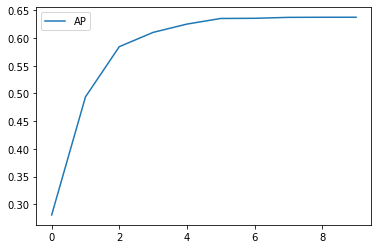

In [ ]:
plot("/content/drive/MyDrive/proj/rcnn_checkpoints/fasterrcnn_resnet50_fpn_lr_0.005_wd_0.0005")

## Detect

In [ ]:
def detect(saved_state, num_images):
  device = torch.device('cpu')
  model = torchvision.models.detection.fasterrcnn_resnet50_fpn()
  in_features = model.roi_heads.box_predictor.cls_score.in_features
  model.roi_heads.box_predictor = FastRCNNPredictor(in_features, 2)
  model.load_state_dict(torch.load(saved_state))
  dataset_test = DotaDataset('all-data_cleaned', get_transform(train=False))
  torch.manual_seed(0)
  indices = torch.randperm(len(dataset_test)).tolist()

  train_valid_border = int(len(indices)*0.7)
  valid_test_border = int(len(indices)*0.85)
  dataset_test = torch.utils.data.Subset(dataset_test, indices[valid_test_border:valid_test_border+num_images])
  data_loader_test = torch.utils.data.DataLoader(
      dataset_test, batch_size=1, shuffle=False, num_workers=0,
      collate_fn=collate_fn)

  metric_logger = MetricLogger(delimiter="  ")
  header = 'Test:'
  model.eval()
  idx = 0
  for images, targets in metric_logger.log_every(data_loader_test, 100, header):
      images = list(img.to(device) for img in images)
      torch.cuda.synchronize()
      model_time = time.time()
      outputs = model(images)
      total = 0
      for i in outputs[0]['scores']:
        if i >= 0.5:
          total += 1
        else:
          break
      boxes = outputs[0]['boxes'][:total]
      model_time = time.time() - model_time
      plt.figure(frameon=False)
      fig, ax = plt.subplots(figsize=(15,15))
      ax.imshow(images[0].permute(1,2,0), aspect='auto')
      for box in boxes:
        # Create a Rectangle patch
        rect = patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], linewidth=3, edgecolor='#66FF00', facecolor='none')
        # Add the patch to the Axes
        ax.add_patch(rect)
      plt.axis('off')
      plt.show()
      fig.savefig('/content/fig_{}.png'.format(idx), bbox_inches='tight', pad_inches=0)
        
      evaluator_time = time.time()
      evaluator_time = time.time() - evaluator_time
      metric_logger.update(model_time=model_time, evaluator_time=evaluator_time)
      idx += 1
  x = evaluate(model, data_loader_test, device)
  print(x)
  print("precisions:", x[1])
  print("recalls:", x[2])

In [ ]:
class ComposeCustom(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image):
        for t in self.transforms:
            image = t(image)
        return image

class ToTensorCustom(object):
    def __call__(self, image):
        image = F.to_tensor(image)
        return image


class CustomDataset(object):
    def __init__(self, root, transforms):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "images"))))[:]

    def __getitem__(self, idx):
        # load images ad masks
        img_path = os.path.join(self.root, "images", self.imgs[idx])
        img = Image.open(img_path).convert("RGB")

        if self.transforms is not None:
            img = self.transforms(img)
        return img

    def __len__(self):
      return len(self.imgs)

def get_custom_transform():
    transforms = []
    transforms.append(ToTensorCustom())
    return ComposeCustom(transforms)

def detect_custom(saved_state, path, from_memory=False):
  device = torch.device('cpu')
  model = torchvision.models.detection.fasterrcnn_resnet50_fpn()
  in_features = model.roi_heads.box_predictor.cls_score.in_features
  model.roi_heads.box_predictor = FastRCNNPredictor(in_features, 2)
  model.load_state_dict(torch.load(saved_state))
  model.eval()

  dataset_custom = CustomDataset(path, get_custom_transform())
  data_loader_custom = torch.utils.data.DataLoader(
    dataset_custom, batch_size=1, shuffle=False, num_workers=0)
  idx = 0
  for imgs in data_loader_custom:
    outputs = model(imgs)
    total = 0
    for i in outputs[0]['scores']:
      if i >= 0.5:
        total += 1
      else:
        break
    boxes = outputs[0]['boxes'][:total]
    plt.figure(frameon=False)
    fig, ax = plt.subplots(figsize=(15,15))
    ax.imshow(imgs[0].permute(1,2,0), aspect='auto')
    for box in boxes:
      # Create a Rectangle patch
      rect = patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], linewidth=3, edgecolor='#66FF00', facecolor='none')
      # Add the patch to the Axes
      ax.add_patch(rect)
    plt.axis('off')
    plt.show()
    fig.savefig('/content/fig_custom_{}.png'.format(idx), bbox_inches='tight', pad_inches=0)
    idx += 1

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


<Figure size 432x288 with 0 Axes>

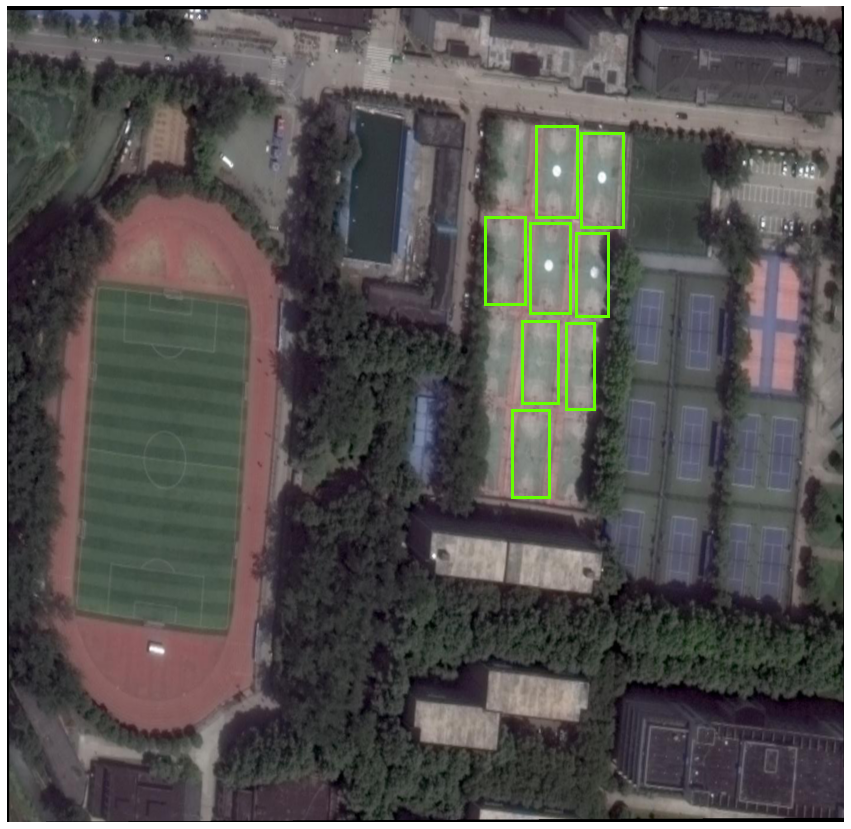

Test:  [0/5]  eta: 0:00:30  model_time: 3.2623 (3.2623)  evaluator_time: 0.0000 (0.0000)  time: 6.1410  data: 0.2082  max mem: 162


<Figure size 432x288 with 0 Axes>

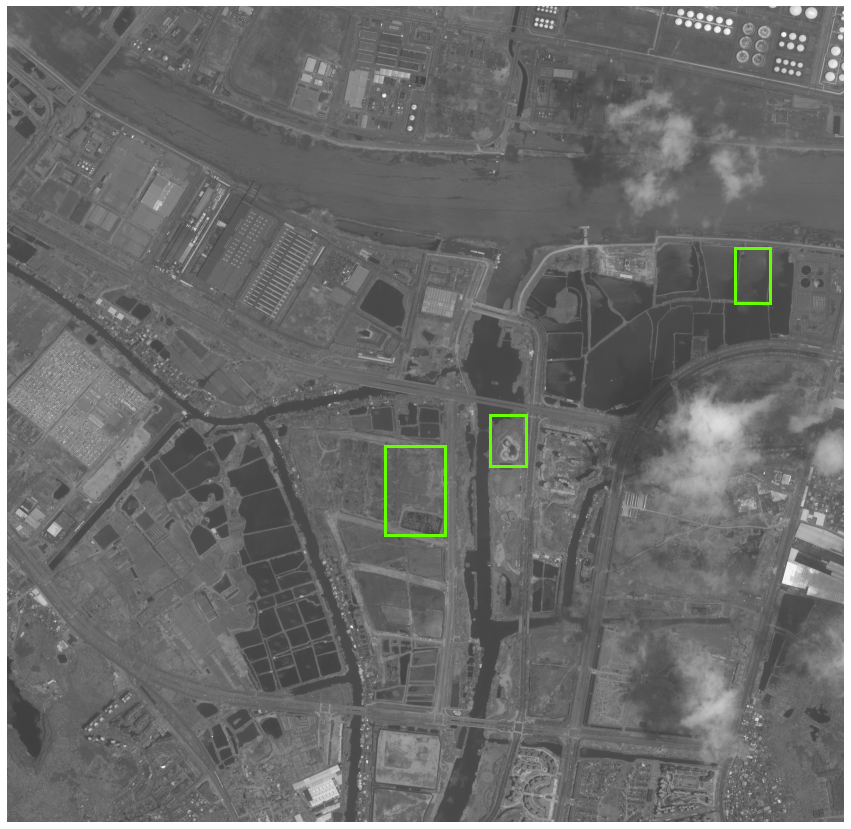

<Figure size 432x288 with 0 Axes>

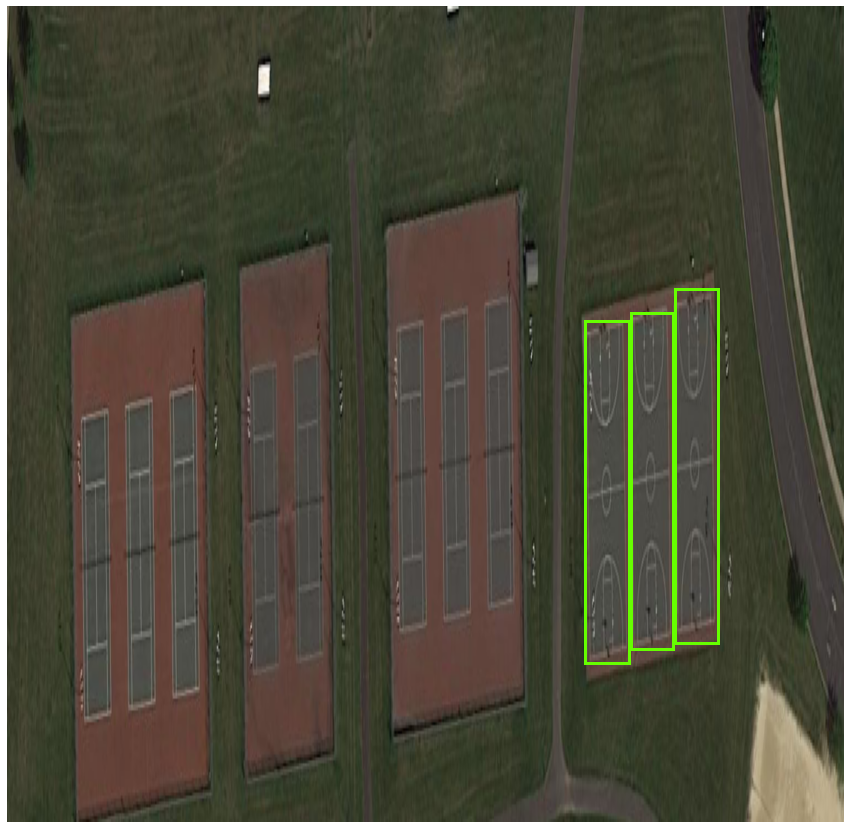

<Figure size 432x288 with 0 Axes>

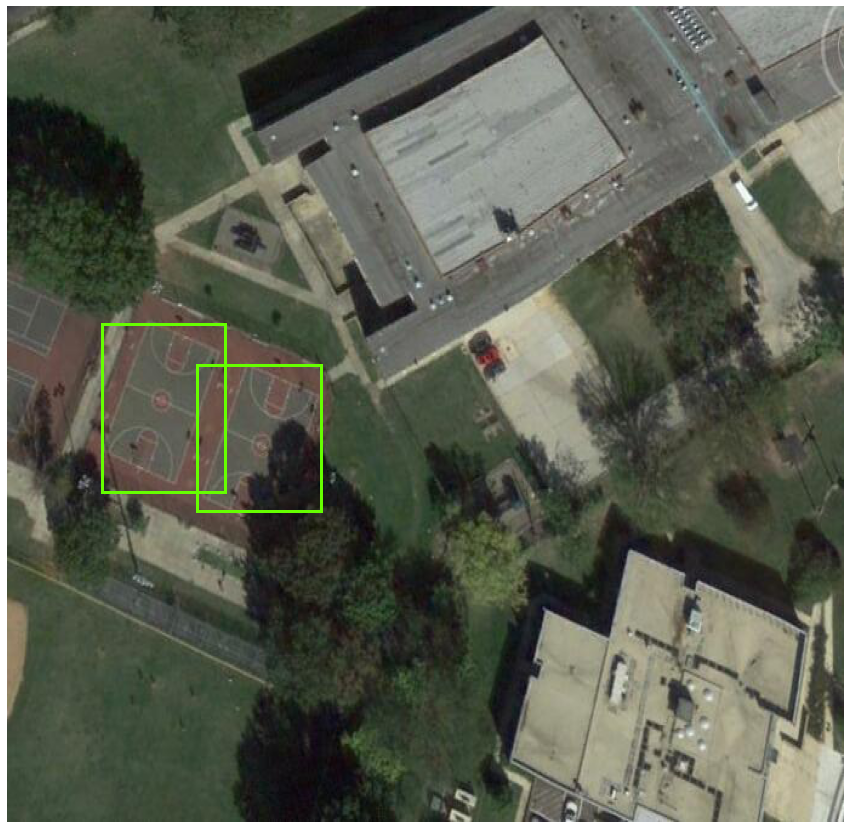

<Figure size 432x288 with 0 Axes>

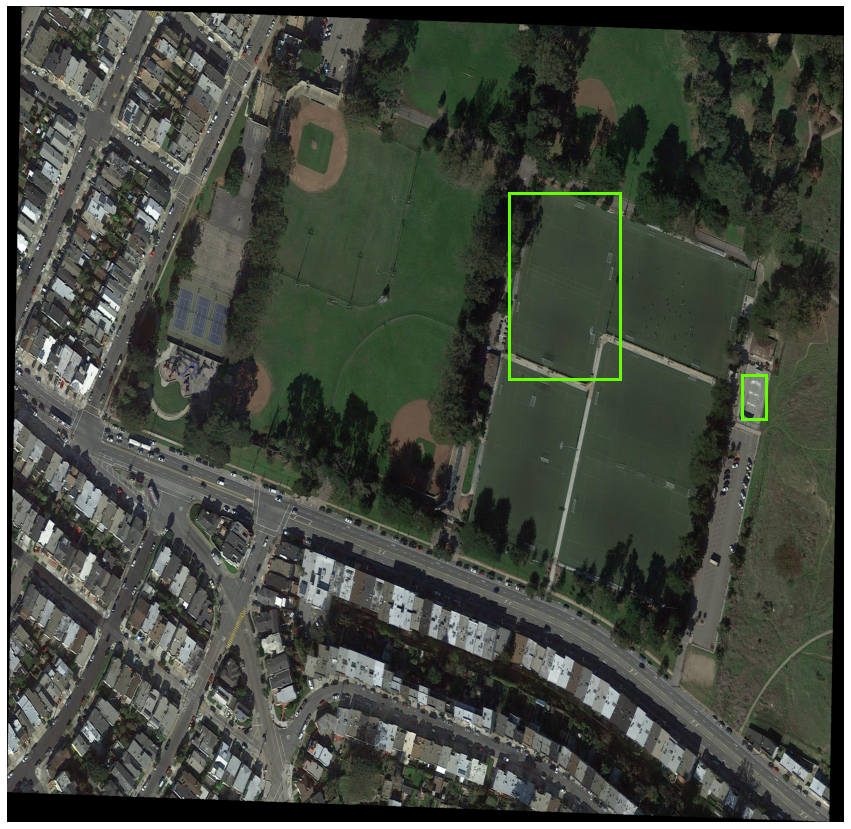

Test:  [4/5]  eta: 0:00:05  model_time: 2.9187 (2.6162)  evaluator_time: 0.0000 (0.0000)  time: 5.4631  data: 0.1739  max mem: 162
Test: Total time: 0:00:27 (5.4636 s / it)
creating index...
index created!
Test:  [0/5]  eta: 0:00:23  model_time: 4.4766 (4.4766)  evaluator_time: 0.0125 (0.0125)  time: 4.6607  data: 0.1714  max mem: 162
Test:  [4/5]  eta: 0:00:04  model_time: 4.3824 (3.8318)  evaluator_time: 0.0034 (0.0048)  time: 4.0045  data: 0.1663  max mem: 162
Test: Total time: 0:00:20 (4.0049 s / it)
Averaged stats: model_time: 4.3824 (3.8318)  evaluator_time: 0.0034 (0.0048)
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 mAP                (mAP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.613
 mAP                (mAP) @[ IoU=0.50      | area=medium | maxDets=100 ] = 0.505
0.1 precision: 0.461   recall:    0.443
0.2 precision: 0.58    recall:    0.529
0.3 precision: 0.58    recall:    0.529
0.4 precision: 0.578   recall:    0.514
0.5 precision: 0.6   re

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:486: RuntimeWarning: invalid value encountered in true_divide


In [ ]:
model = "/content/drive/MyDrive/proj/rcnn_checkpoints/faster_rcnn_lr_0.005/epoch_5_ap_657_recall_759.pth"
detect(model, 5)

<Figure size 432x288 with 0 Axes>

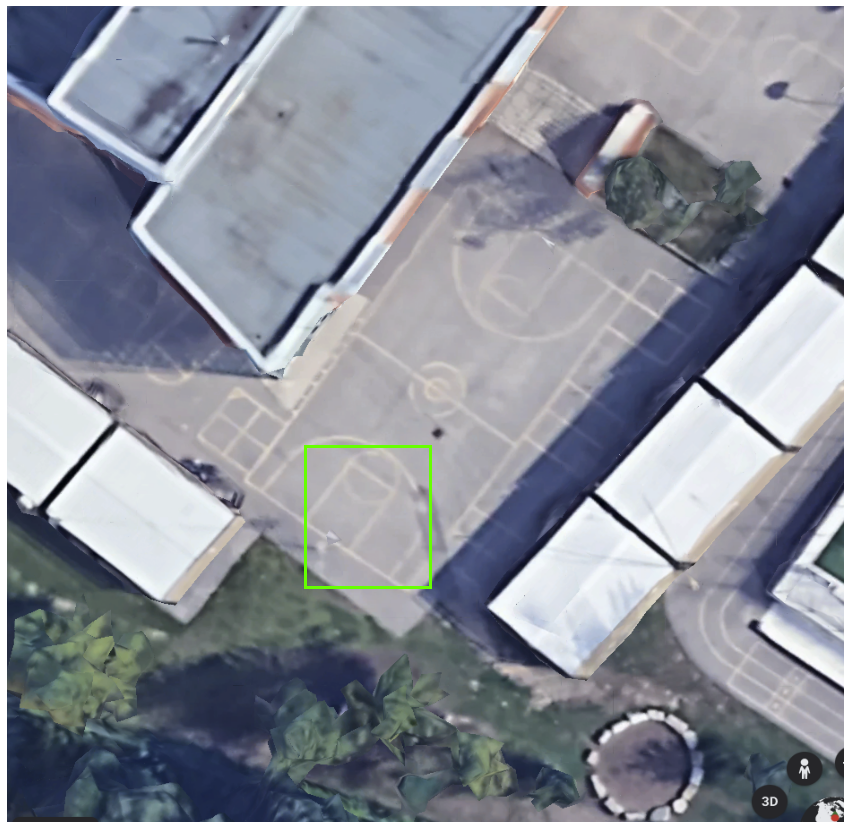

<Figure size 432x288 with 0 Axes>

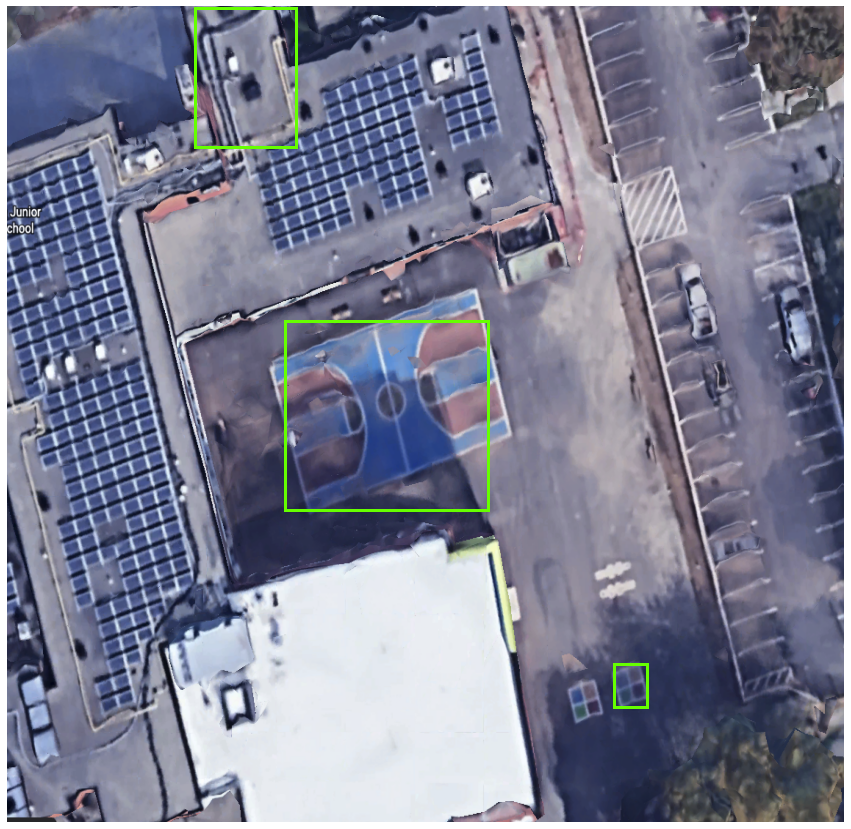

<Figure size 432x288 with 0 Axes>

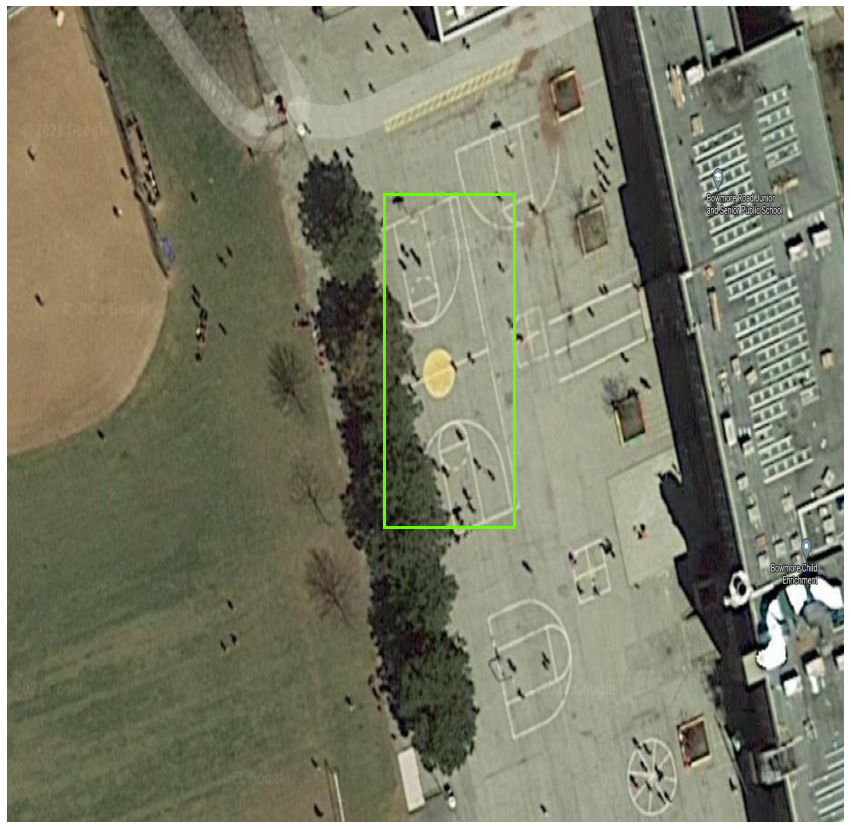

<Figure size 432x288 with 0 Axes>

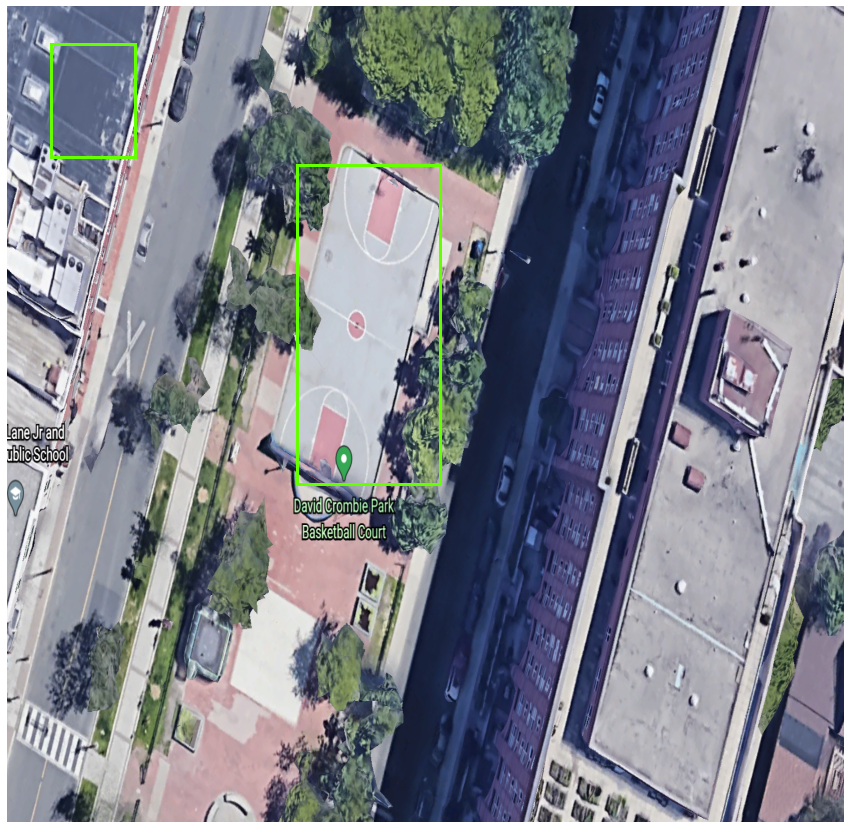

<Figure size 432x288 with 0 Axes>

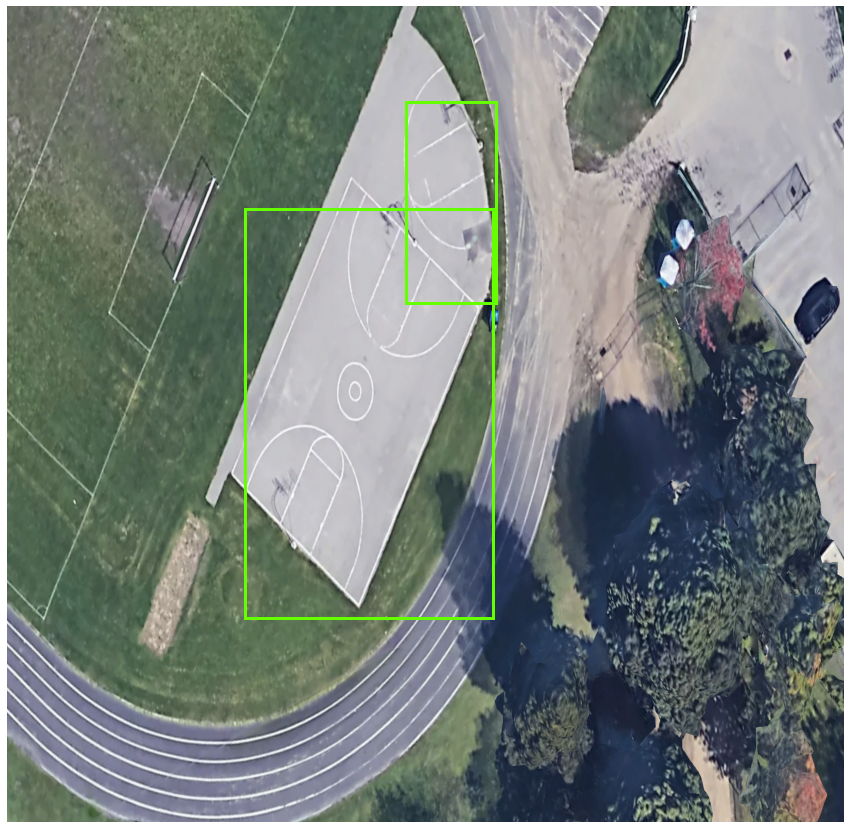

ValueError: ignored

In [ ]:
detect_custom(model, "/content/drive/MyDrive/proj/toronto_images")